In [1]:
from google.colab import drive
drive.mount('/content/drive')
directory = '/content/drive/My Drive/Big Data/data/'

Mounted at /content/drive


# Import data, pre-processing and model training

In [2]:
%matplotlib inline
import os, sys, inspect
#PATH = '/content/drive/My Drive/Big Data/data/'
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# sklearn modules
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, RepeatedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, classification_report, roc_curve, auc, plot_confusion_matrix, roc_auc_score
from imblearn.over_sampling import SMOTE

import warnings
warnings.filterwarnings('ignore')

#UTILITY FUNCTIONS

# Plot confusion matrix 
def make_confusion_matrix(cfm, title):
    group_names = ['TN','FP','FN','TP']

    group_counts = ["{0:0.0f}".format(value) for value in
                cfm.flatten()]

    group_percentages = ["{0:.2%}".format(value) for value in
                     cfm.flatten()/np.sum(cfm)]

    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

    labels = np.asarray(labels).reshape(2,2)
    plt.title(title)
    
    sns.heatmap(cfm, annot=labels, fmt="", cmap='Blues')
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted',fontsize=12)

#Plot auc curve 
def plot_roc_curve(model, X_test, y_test, name_model):
    probs = model.predict_proba(X_test)
    preds = probs[:,1]
    fpr, tpr, threshold = roc_curve(y_test, preds)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, label=name_model+' (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()

def get_auc_value(x, y): 
    probs = model.predict_proba(x.values)
    preds = probs[:,1]
    fpr, tpr, threshold = roc_curve(y, preds)
    roc_auc = auc(fpr, tpr)
    return roc_auc

#Encode columns
def encoder(df, column): 
    le.fit(df[column])
    le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_))) 
    print('\t',le_name_mapping)
    return le.transform(df[column])


#Multicolumn encoder
class MultiColumnLabelEncoder:

    def __init__(self, columns=None):
        self.columns = columns # array of column names to encode


    def fit(self, X, y=None):
        self.encoders = {}
        columns = X.columns if self.columns is None else self.columns
        for col in columns:
            self.encoders[col] = LabelEncoder().fit(X[col])
        return self


    def transform(self, X):
        output = X.copy()
        columns = X.columns if self.columns is None else self.columns
        for col in columns:
            output[col] = self.encoders[col].transform(X[col])
        return output


    def fit_transform(self, X, y=None):
        return self.fit(X,y).transform(X)


    def inverse_transform(self, X):
        output = X.copy()
        columns = X.columns if self.columns is None else self.columns
        for col in columns:
            if col != 'death_description':
              output[col] = self.encoders[col].inverse_transform(X[col].astype(int))
        return output

    def inverse_transform_desc(self, X):
        output = X.copy()
        columns = X.columns if self.columns is None else self.columns
        for col in columns:
            if col == 'death_description':
              output[col] = self.encoders[col].inverse_transform(X[col].astype(int))
        return output


def simple_SHAP(df_shap, df):
    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop('index',axis=1)
    
    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i],df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns  = ['Variable','Corr']
    corr_df['Sign'] = np.where(corr_df['Corr']>0,'red','blue')
    # Plot it
    shap_abs = np.abs(shap_v)
    k=pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ['Variable','SHAP_abs']
    k2 = k.merge(corr_df,left_on = 'Variable',right_on='Variable', how='inner')
    k2 = k2.sort_values(by='SHAP_abs',ascending = True)
    colorlist = k2['Sign']
    ax = k2.plot.barh(x='Variable',y='SHAP_abs',color = colorlist, figsize=(8, 8), legend=False)
    ax.set_xlabel("SHAP Value (Red = Positive Impact)")
    
def make_shap_waterfall_plot(shap_values, features, num_display=20):
    sns.set_style("whitegrid")
    column_list = features.columns
    feature_ratio = (np.abs(shap_values).sum(0) / np.abs(shap_values).sum()) * 100
    column_list = column_list[np.argsort(feature_ratio)[::-1]]
    feature_ratio_order = np.sort(feature_ratio)[::-1]
    cum_sum = np.cumsum(feature_ratio_order)
    column_list = column_list[:num_display]
    feature_ratio_order = feature_ratio_order[:num_display]
    cum_sum = cum_sum[:num_display]
    
    num_height = 0
    if (num_display >= 20) & (len(column_list) >= 20):
        num_height = (len(column_list) - 20) * 0.4
        
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(16, 8 + num_height))
    ax1 = axes.flat[0]
    ax1.plot(cum_sum[::-1], column_list[::-1], c='blue', marker='o')
    ax2 = ax1.twiny()
    ax2.barh(column_list[::-1], feature_ratio_order[::-1], alpha=0.6)
    
    ax1.grid(True)
    ax2.grid(False)
    ax1.set_xticks(np.arange(0, round(cum_sum.max(), -1)+1, 10))
    ax2.set_xticks(np.arange(0, round(feature_ratio_order.max(), -1)+1, 10))
    ax1.set_xlabel('Cumulative Ratio')
    ax2.set_xlabel('Composition Ratio')
    ax1.tick_params(axis="y", labelsize=13)
    plt.ylim(-1, len(column_list))

    nbr_features = 15
    tree_feature_importances = model.feature_importances_
    sorted_idx = tree_feature_importances.argsort()[-nbr_features:]
    y_ticks = np.arange(0, len(sorted_idx))
    axes.flat[1].barh(y_ticks, tree_feature_importances[sorted_idx])
    axes.flat[1].set_yticks(y_ticks)
    axes.flat[1].set_yticklabels(np.array(police.columns)[sorted_idx])
    axes.flat[1].set_title("Random Forest Feature Importances")

    fig.tight_layout() 
    plt.show()
    
    # Shap waterfall plot


In [3]:
df = pd.read_csv(directory + 'df_final2.csv')
police = df.copy()
del police['Unnamed: 0']
print(police.shape)

print('Police.shape:', police.shape)

(27999, 28)
Police.shape: (27999, 28)


In [4]:
#Date
police['death_date'] =  pd.to_datetime(police['death_date'])
police['year'] = police['death_date'].dt.year
police['month'] = police['death_date'].dt.month
police.drop(labels=['death_date'], axis=1, inplace=True)

#NaN
police.dropna(inplace = True)

In [5]:
#take dispositions_exclusions to be deleted 
unreported = police[police['dispositions_exclusions'] == "Unreported"]
suicide = police[police['dispositions_exclusions'] == "Suicide"]
pending = police[police['dispositions_exclusions'] == 'Pending']

In [6]:
year_df = police[['year']]

In [7]:
#Target
target = police[['dispositions_exclusions']]
del police['dispositions_exclusions']

print('Target.shape:', target.shape)

Target.shape: (27160, 1)


In [8]:
original = [0,1,2,3,4,5,7,8,9,10,11,12,26,27]
police = police.iloc[:, original]
police.head()
expl_df = police.copy()

print('Police.shape:', police.shape)

Police.shape: (27160, 14)


In [9]:
#delete found rows 
police.drop(unreported.index, axis=0, inplace=True)
police.drop(suicide.index, axis=0, inplace=True)
police.drop(pending.index, axis=0, inplace=True)

target.drop(unreported.index, axis=0, inplace=True)
target.drop(suicide.index, axis=0, inplace=True)
target.drop(pending.index, axis=0, inplace=True)

print('Police.shape:', police.shape)
print('Target.shape:', target.shape)
expl_police = police.copy()

Police.shape: (7838, 14)
Target.shape: (7838, 1)


In [10]:
expl_police.head()

,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month
7,20,Male,European-American/White,No,Gunshot,Yes,"Rancho cordova, Sacramento, CA","Sacramento, CA",38.599099,-121.285771,Deputy Michael Haynes shot Jevon Lee Drake whe...,CA,2000,9
44,31,Male,Hispanic/Latino,No,Asphyxiated/Restrained,Yes,"Pacoima, Los Angeles, CA","Los Angeles, CA",34.268842,-118.415827,Peter Mares was left brain dead/persistent veg...,CA,2000,9
63,85,Male,European-American/White,Yes,Gunshot,Yes,"Hemet, Riverside, CA","Riverside, CA",33.747926,-116.959916,"Officer David Quinn, Detective Jim Anderson an...",CA,2000,2
65,23,Male,Hispanic/Latino,No,Gunshot,Yes,"Riverside, Riverside, CA","Riverside, CA",34.024327,-117.425389,Off-duty Fontana Cpl. Robert Ratcliffe shot an...,CA,2000,5
92,25,Male,European-American/White,Yes,Gunshot,Yes,"San diego, San Diego, CA","San Diego, CA",32.726607,-117.071753,Police shot and killed Christopher George Heim...,CA,2000,1


In [11]:
#Attributes and encoding
numerics_attrs = police.select_dtypes(include=np.number).columns.tolist()
categorical_attrs = list(set(police.columns) - set(numerics_attrs))

print('Categorical attributes:', categorical_attrs, '\n')

le = LabelEncoder()
print('Variable Mapping:')
for col in categorical_attrs: 
  #print('\n---------------  ' , col, '  ---------------')
  police[col] = encoder(police, col)

Categorical attributes: ['death_cause', 'state_po', 'use_of_force', 'mental_illness', 'gender', 'race', 'death_county', 'death_city', 'death_description'] 

Variable Mapping:
	 {'Asphyxiated/Restrained': 0, 'Beaten/Bludgeoned with instrument': 1, 'Burned/Smoke inhalation': 2, 'Chemical agent/Pepper spray': 3, 'Drowned': 4, 'Drug overdose': 5, 'Fell from a height': 6, 'Gunshot': 7, 'Medical emergency': 8, 'Other': 9, 'Stabbed': 10, 'Tasered': 11, 'Vehicle': 12}
	 {'AK': 0, 'AL': 1, 'AR': 2, 'AZ': 3, 'CA': 4, 'CO': 5, 'CT': 6, 'DC': 7, 'DE': 8, 'FL': 9, 'GA': 10, 'HI': 11, 'IA': 12, 'ID': 13, 'IL': 14, 'IN': 15, 'KS': 16, 'KY': 17, 'LA': 18, 'MA': 19, 'MD': 20, 'ME': 21, 'MI': 22, 'MN': 23, 'MO': 24, 'MS': 25, 'MT': 26, 'NC': 27, 'ND': 28, 'NE': 29, 'NH': 30, 'NJ': 31, 'NM': 32, 'NV': 33, 'NY': 34, 'OH': 35, 'OK': 36, 'OR': 37, 'PA': 38, 'RI': 39, 'SC': 40, 'SD': 41, 'TN': 42, 'TX': 43, 'UT': 44, 'VA': 45, 'VT': 46, 'WA': 47, 'WI': 48, 'WV': 49, 'WY': 50}
	 {'No': 0, 'Vehicle/Pursuit': 1

In [12]:
#Target Variable Encoding
le = LabelEncoder()
print('Target Variable Mapping:')
target['dispositions_exclusions'] = encoder(target, 'dispositions_exclusions')
print('\n')

print(target.value_counts())

Target Variable Mapping:
	 {'Guilty': 0, 'Justified': 1}


dispositions_exclusions
1                          6457
0                          1381
dtype: int64


In [13]:
#split on train-test 
X_train, X_test, y_train, y_test = train_test_split(police, target, test_size=0.30, random_state=42, stratify=target, shuffle=True) 

print('Target distribytion in train set:')
(unique, counts) = np.unique(y_train, return_counts=True)
print(np.asarray((unique, counts)).T)

#Normalize
scaler = MinMaxScaler()
scaler.fit(X_train)

Target distribytion in train set:
[[   0  967]
 [   1 4519]]


MinMaxScaler()

In [14]:
X_train = pd.DataFrame(scaler.transform(X_train), index=X_train.index, columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), index=X_test.index, columns=X_test.columns)

In [15]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
import pydotplus
from sklearn import tree
from IPython.display import Image
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

Accuracy 0.9238945578231292
F1-score [0.76539974 0.95458006]
              precision    recall  f1-score   support

           0       0.84      0.71      0.77       414
           1       0.94      0.97      0.95      1938

    accuracy                           0.92      2352
   macro avg       0.89      0.84      0.86      2352
weighted avg       0.92      0.92      0.92      2352



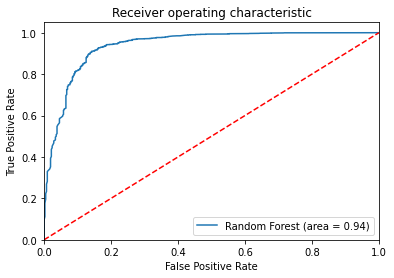

In [16]:
model = RandomForestClassifier(n_estimators=1000, criterion='entropy', max_depth=None, min_samples_split=3, 
                               min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt',
                               random_state=42, bootstrap=False, n_jobs=-1)

model.fit(X_train, y_train)

y_pred_forest = model.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred_forest))
print('F1-score %s' % f1_score(y_test, y_pred_forest, average=None))
print(classification_report(y_test, y_pred_forest))
plot_roc_curve(model, X_test, y_test, 'Random Forest')

#Check model performances on different years

In [17]:
# inverse transform year
test = X_test.copy()
test['year'] = scaler.inverse_transform(X_test)[:, [12]].astype(int)

In [18]:
# attach target varible to the test set (to evaluate the performances of the models)
test['target'] = y_test.values

In [19]:
years_list = test['year'].unique()
years_list.sort()
f1_zero, f1_one, accuracy, roc, years = [], [], [], [], []
guilty_count, justified_count = [], []

In [20]:
for year in years_list: 
    y = test[test['year'] == year]['target'] #save target to test performances 
    to_predict = test[test['year'] == year].drop('target', axis = 1) #prepare dataset for the prediction
    prediction = model.predict(to_predict.values) 

    #save metrics for the performances of the models
    years.append(year)
    accuracy.append(accuracy_score(y, prediction))
    f1_one.append(f1_score(y, prediction, average = None)[1])
    f1_zero.append(f1_score(y, prediction, average = None)[0])
    roc.append(get_auc_value(to_predict, y))
    guilty_count.append(y.value_counts().sort_index()[0])
    justified_count.append(y.value_counts().sort_index()[1])

In [21]:
import plotly.graph_objects as go

Sample size

In [22]:
x=years
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x, y=guilty_count,
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='red'),
    stackgroup='one', name='Guilty Count'
))
fig.add_trace(go.Scatter(
    x=x, y=justified_count,
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='blue'),
    stackgroup='one', name='Justified Count')
)
fig.update_layout(title='Sample size by label on different years',
                xaxis_title='Year',
                yaxis_title='Metric score',
                xaxis = dict(
                    tickmode = 'linear',
                    tick0 = 2000,
                    dtick = 1),
                width = 1300, 
                height = 500,
                legend=dict(
                    yanchor="bottom",
                    y=.75,
                    xanchor="right",
                    x=.95, 
                    font=dict(
                        #family="Courier",
                        size=15,
                        #color="black"
                        ),
                  bgcolor="White",
                  bordercolor="Black",
                  borderwidth=2
                  )
)
fig.show()

* Peak in 2013, with 156 Justified and 29 Guilty
* Lowest count in 2020, with 20 Justified and 20 Guilty
* Lowest sample size in 2020 because we only have records until June
* Having kept only Guilty and Justified records for the target variable, the recent years have less records because there were more Pending.

In [23]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=years, y=accuracy, mode='lines+markers', name='Accuracy')) #Accuracy
fig.add_trace(go.Scatter(x=years, y=roc, mode='lines+markers', name='ROC - AUC')) #ROC AUC
fig.add_trace(go.Scatter(x=years, y=f1_one, mode='lines+markers', name='F1 - Justified'))
fig.add_trace(go.Scatter(x=years, y=f1_zero, mode='lines+markers', name='F1 - Guilty'))

fig.update_layout(title='Evaluation Metrics on different years',
                width = 1300, 
                height = 500, 
                xaxis_title='Year',
                yaxis_title='Metric score',
                xaxis = dict(
                    tickmode = 'linear',
                    tick0 = 2000,
                    dtick = 1), 
                    legend=dict(
                        yanchor="bottom",
                        y=.2,
                        xanchor="right",
                        x=0.95, 
                        font=dict(
                            #family="Courier",
                            size=15,
                            #color="black"
                            ),
                        bgcolor="White",
                        bordercolor="Black",
                        borderwidth=2
                    )
)
fig.show()

* Slightly increasing trend for Accuracy and F1-Justified metrics, reaching a peak in 2017.
* F1-Guilty increases a lot in 2017, since it is the year from which the two classes star to become less unbalanced. ROC-AUC increases slightly too.

# Global explainability

### Import functions and data

In [24]:
!pip install shap

     |████████████████████████████████| 564 kB 7.6 MB/s 


In [25]:
import shap
# Import the package
shap.initjs()
explainer = shap.TreeExplainer(model)

Compute shap values, dump them in picke files and load them from there (would take too long to run live)

In [26]:
import pickle
#Compute shap values for train set, test set, and pending records

#shap_values_train = explainer.shap_values(X_train, approximate=False, check_additivity=False)  #train set
#shap_values_test = explainer.shap_values(X_test, approximate=False, check_additivity=False)    #test set
#shap_values_blind = explainer.shap_values(pendings, approximate=False, check_additivity=False) #pending set 

#Dump shap values in pickle files

#a_file_train = open(directory+"shap_values_train.pkl", "wb")
#pickle.dump(shap_values_train, a_file_train)
#a_file_train.close()

#a_file_test = open(directory+"shap_values_test.pkl", "wb")
#pickle.dump(shap_values_test, a_file_test)
#a_file_test.close()

#a_file_blind = open(directory+"shap_values_blind.pkl", "wb")
#pickle.dump(shap_values_blind, a_file_blind)
#a_file_blind.close()

In [27]:
a_file_train = open(directory+"shap_values_train.pkl", "rb") 
shap_values_train = pickle.load(a_file_train) # TRAIN

a_file_test = open(directory+"shap_values_test.pkl", "rb") 
shap_values_test = pickle.load(a_file_test) #TEST

a_file_blind = open(directory+"shap_values_blind.pkl", "rb")
shap_values_blind = pickle.load(a_file_blind) #BLIND only pendings

## Features importance SHAP vs Random Forest Feature Importances

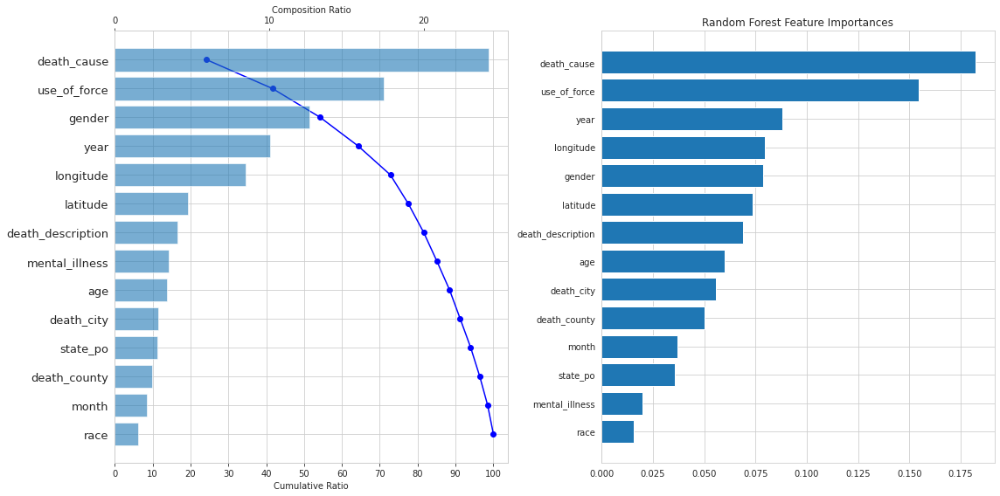

In [28]:
make_shap_waterfall_plot(shap_values_train[1], X_train)

* The chart on the left shows the SHAP summary for the average contribution of features to the prediction. The curved line shows the same information but in such a way that the values add up to 100.
* death_cause and use_of_force are the two most important features, both for SHAP and feature importance (FI). 
* The difference between important features and less important features is greater with SHAP than with FI. Notice the drop after "longitude" in SHAP.
* Race is the least important feature for prediction in both cases! As we have seen in the data understanding part, black people have indeed a higher death rate than white people. However, in this phase we are talking about the **legal outcomes** of the fatal encounters: while race might unfortunately be an important bias in the behavior of some officers in the U.S.A, at least from our classification it seems that Judges are not influenced by this bias. 

Summary Plots with contribution signs

* These two charts show again the aggregated SHAP values for each features, this time highlighting how high and low values of each feature bring the prediction closer to Guilty or Justified.





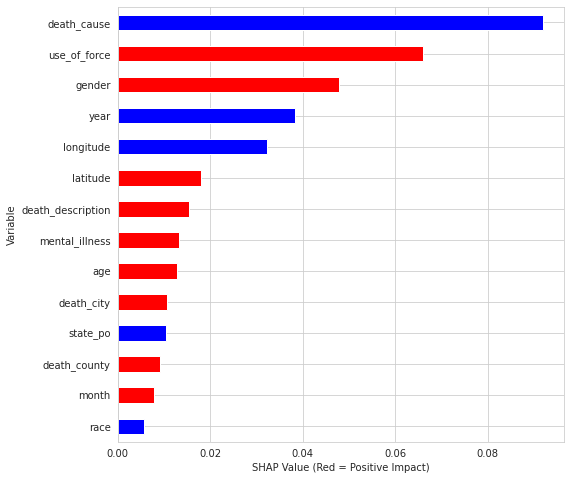

In [29]:
simple_SHAP(shap_values_train[1], X_train) 

* The simpler bar charts shows in blue features where high values push towards Guilty (class label 0, negative relation), in red features where high values push towards Justified (class label 1, positive relation).

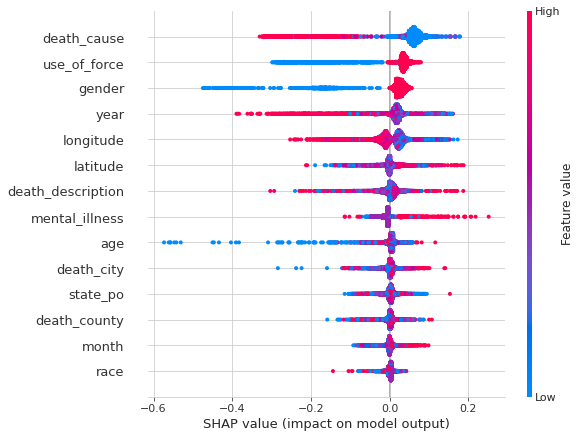

In [30]:
shap.summary_plot(shap_values_train[1], X_train)

This second chart shows the same information, through plotting each data point for each feature, coloured by its value and positioned on the X axis depending on the contribution that value of that feature gave to the prediction for that row (left: Guilty, right: Justified)


Some considerations for the most important variables:

* **Death cause**: "High" values push towards Guilty. In particular, as we will see with the next chart, the last value in the encoding is "Vehicle", which has very high correlation with the Guilty class. We had an hint about this when we trained the Decision Tree: the first split had a very high Gini and was "Death_cause < 0.99". 

* **Use of force**: The values were "No" (0), "Vehicle/Pursuit" (0.5) and "Yes" (1). High values ("Yes") push towards Justified, confirming the fact that this variable is about whether or not the victim resisted the officers in any way.

* **Gender**: Females victims are more likely to result in the officers being judged Guilty.

* **Year**: A more recent date push towards predicting Guilty. This may be caused by an increased sensibility about police brutality in recent years, but we need to remember that, as we have shown before, removing the "Pending" records (which are obviously all recent), the two classes are much more balanced from 2016 onwards: therefore, the model naturally predicts more Guilty values than in the rest of the dataset.

* **Longitude**: Highest values (West coast) push toward Guilty.

* **Mental illness**: The values were 'Drug or alcohol use': 0, 'No': 1, 'Yes': 2. High values (Yes) push the prediction towards "Justified".

* **Age**: Overall it's not a very important feature. However, we can see that some low values push the classification toward Guilty by **a lot**. We will see in the next chart the meaning of this behaviour. 

## SHAP Dependence Plot for Global Interpretability

These next plots show, for each feature, the dependence between its value (on the X-axis) and its SHAP value (Y-axis) for each data point in the train set. They are very useful to see in detail **which** values push the prediction towards Guilty or Justified, especially since most of our features were categorical and had to be encoded, which might make the summary plot shown above not as clear as we would like.

Points over the 0 contribute positively to the prediction (Justified), points under 0 contribute negatively (Guilty).

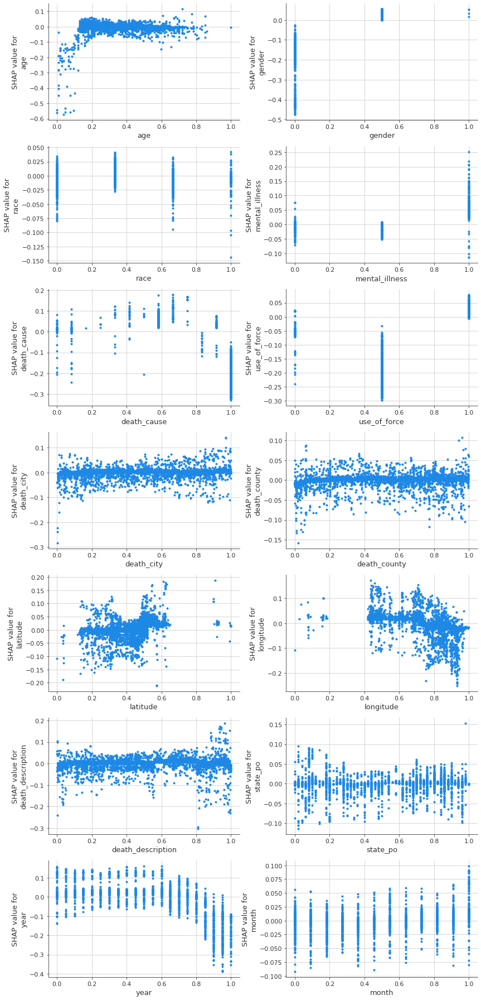

In [31]:
# To see possible interaction togliere interaction_index parameter
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(12,25))
i = 0
for col in X_train.columns: 
  ax = axes.flat[i]
  shap.dependence_plot(col, shap_values_train[1], X_train, ax=ax,  interaction_index=None, show=False)
  i += 1

fig.tight_layout()
plt.show()

Some considerations:
* **Age**: we can see that the values pushing a lot towards Guilty are the smallest ones, where a very small person has died in the fatal encounter.
* **Gender**: All female values bring the classification towards Guilty, while Male and Transgeder always push towards Justified, even though by a very small amount.
* **Race**: *{'African-American/Black': 0, 'European-American/White': 1, 'Hispanic/Latino': 2, 'Other': 3}* All the values are centered around zero. The second one, "White", is the one that's a little more skewed towards the upper area of the graph, while the others have some data points more in the bottom half, but overall the greatest percentage of the distribution is in the middle.
* **Mental Ilness**: *{No - Drug or Alcol Abuse - Yes}*
The YES values bring the classification more towards Justified.
* **Death Cause**: Here we can see the last value (Vehicle) that brings the prediction heavily towards Guilty. Note also the tenth value, Stabbed, which is the only other one that's found only under zero.
* **Use of Force**: Vehicle (0.5) brings heavily the classification towards Guilty (it's paired with "Vehicle" in Death Cause)! No is nearly often pushing towards Guilty, while Yes towards Justified. 
* **Death City**: Is an example of how this plot looks for a variable which is not that important for the prediction: a straight line
* **Longitude**: Here we can see how higher values have a higher chance of pushing towards Guilty.
* **Year**: More recent years push more towards Guilty, for the reasons discussed above.


## Bar graphs

The following bar plots show the normalized distribution of the two target classes against values the values of some of the features, to visualize a bit more clearly the relations we have talked about. We can see the contribution of Stabbed, Vehicle, Use of Force Yes, Female, the fact that Race is not important, low age, high longitude, recent year.

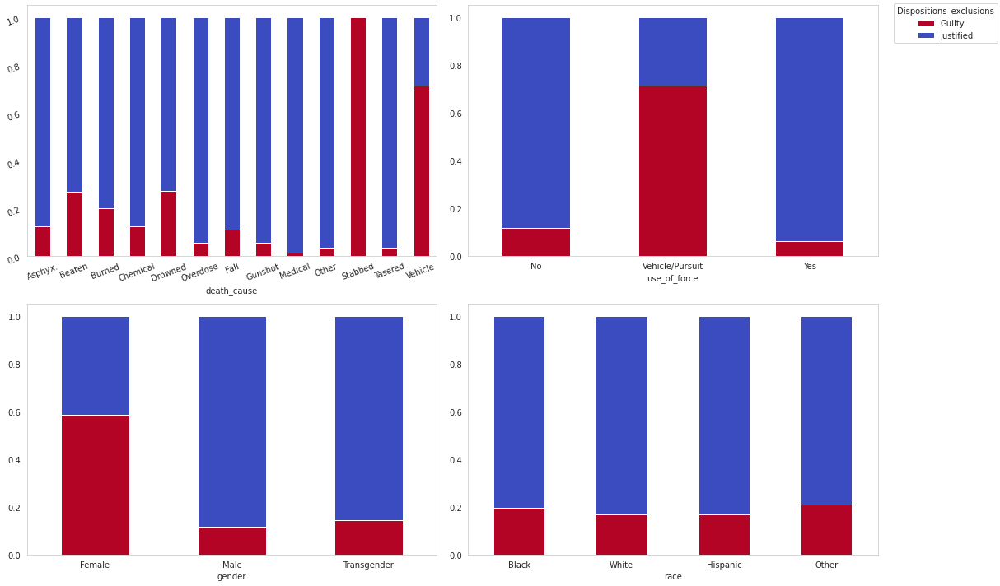

In [32]:
fig, axes = plt.subplots(2,2, figsize=(15,10))
sns.set_style("white")
i=0
for col in ['death_cause', 'use_of_force', 'gender', 'race']:
    ax = axes.flat[i]
    table=pd.crosstab(df[col], target['dispositions_exclusions'])
    table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True, cmap='coolwarm_r', ax=ax)
    ax.tick_params(labelrotation=0)
    if(i == 0): 
        labels = [item.get_text() for item in ax.get_xticklabels()]
        labels = ['Asphyx.', 'Beaten', 'Burned', 'Chemical', 'Drowned', 'Overdose', 'Fall', 'Gunshot', 'Medical', 'Other', 'Stabbed', 'Tasered', 'Vehicle']
        ax.set_xticklabels(labels)
        ax.tick_params(labelrotation=20)
    if(i == 3): 
        labels = [item.get_text() for item in ax.get_xticklabels()]
        labels = ['Black','White','Hispanic','Other']
        ax.set_xticklabels(labels)
    ax.get_legend().remove()
    i = i+1

fig.tight_layout() 
fig.legend(ax.get_legend_handles_labels()[0],     
           labels=['Guilty','Justified'],
           loc = 'center left', bbox_to_anchor=(1, .95),
           title="Dispositions_exclusions"  # Title for the legend
           )
plt.show()

Commento

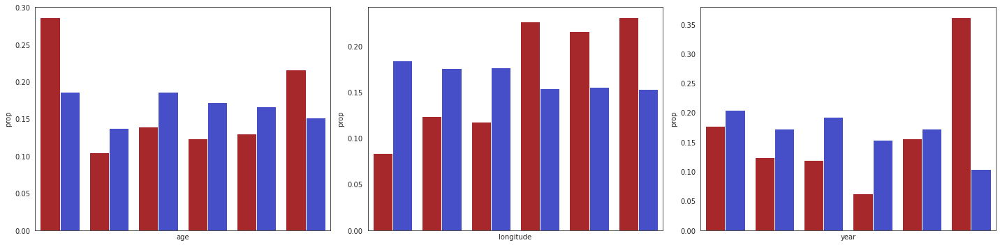

In [33]:
fig, axes = plt.subplots(1,3, figsize=(20,5))
sns.set_style("whitegrid")

i=0
for col in ['age',
 'longitude',
 'year']:
    ax = axes.flat[i]
    (pd.qcut(police[col], q=6, duplicates='drop')
        .groupby(target['dispositions_exclusions'])
        .value_counts(normalize=True)
        .rename('prop')
        .reset_index()
        .pipe((sns.barplot, "data"), x=col, y='prop', hue='dispositions_exclusions', palette=['#BC1316','#303DDE'], ax=ax))
    ax.get_legend().remove()
    ax.set_xticks([])
    i = i+1

fig.tight_layout()
plt.show()

Commento

# Local explainability 

In [34]:
# Get the predictions and put them with the test data.
X_output = X_test.copy()
X_output.loc[:,'predict'] = model.predict(X_output)
y_output = y_test.copy()

In [35]:
def local_exp(id, ds, prediction):
    chosen_instance = ds.loc[[id]]
    shap_values = explainer.shap_values(chosen_instance)
    print('Predicted value:', prediction.loc[id, 'predict'])

    if(prediction.shape[0] == X_test.shape[0]):
        print('True value:', y_output.loc[id])
    else:
        print('True value: Pending')
    
    print('Encounter Description: \n', df.loc[id, 'death_description'])
    shap.initjs()
    expl_df['death_description'] = expl_df['death_description'].str[0:7] + '...'
    p = shap.force_plot(explainer.expected_value[1], shap_values[1], expl_df.loc[[id]])
    return p

### True positive case

The first record analyzed puts the policeman involved as **justified**, considering as relevant factors the cause of death (gunshot) and the fact that the deceased was violent against the policeman.

In [36]:
local_exp(103, X_test, X_output)

Predicted value: 1
True value: dispositions_exclusions    1
Name: 103, dtype: int64
Encounter Description: 
 Officers Joseph Harper and Larry Holloway shot Michael Edward Norman when he allegedly came at them with a bloody knife just after a murder victim was found.


In [37]:
expl_df.loc[[103]]

,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month
103,41,Male,European-American/White,No,Gunshot,Yes,"San diego, San Diego, CA","San Diego, CA",32.750421,-117.056048,Officer...,CA,2000,9


In [38]:
# Calculate Shap values
local_exp(14888, X_test, X_output)

Predicted value: 1
True value: dispositions_exclusions    1
Name: 14888, dtype: int64
Encounter Description: 
 Police were responding to report of a man assaulting a woman. The man, Jurgen, fled the scene and then fired at officers, striking deputy Sheila Aull. Aull and at least four other officers returned fire and killed Jurgen.


The second record analyzed puts the policeman involved as **justified**. Even if the cause of death is Vehicle, which is usually associated to guilty class, and the female gender, the other variables push the prediction higher.  

In [39]:
local_exp(2439, X_test, X_output)

Predicted value: 1
True value: dispositions_exclusions    1
Name: 2439, dtype: int64
Encounter Description: 
 Bernice Martinez, Ashley Martinez, Christina Martinez and Desiree Guzman were killed when their car was struck by a driver fleeing Stockton Unified School District police officer Tim Kegarice.


### True negative case

In this example, every variables pushes towards guilty, with death cause, use of force and gender as the most relevant attributes. 

In [40]:
# Calculate Shap values
local_exp(12071, X_test, X_output)

Predicted value: 0
True value: dispositions_exclusions    0
Name: 12071, dtype: int64
Encounter Description: 
 Elizabeth Arellano Renteria and Hilda Medrano, both 21, were turning into a McDonald's off State Road 70 when an Okeechobee County sheriff's deputy hit their vehicle. Florida Highway Patrol investigators found the deputy was driving close to 90 mph at the moment of impact.


In [41]:
expl_df.loc[[12071]]

,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month
12071,21,Female,Hispanic/Latino,No,Vehicle,Vehicle/Pursuit,"Okeechobee, Okeechobee, FL","Okeechobee, FL",27.244127,-80.826168,Elizabe...,FL,2013,12


The second TN record analyzed regards a policeman that killed his ex-girlfriend. The model predict correctly considering the victim gender.    

In [42]:
local_exp(11760, X_test, X_output)

Predicted value: 0
True value: dispositions_exclusions    0
Name: 11760, dtype: int64
Encounter Description: 
 While on duty, in uniform and driving his marked patrol car, local officer Mark Bomia shot and killed his former girlfriend Anna Beach, strangled her with an extention cord, removed her clothes and dumped her body in the woods. In 2011 he was convicted of first-degree murder and sentenced to life in prison. The city settled a $200K wrongful death suit with Beach's family.


As seen in the global explainability, in this example a vary low value of age pushes the prediction towards guilty.  

In [43]:
local_exp(13933, X_test, X_output)

Predicted value: 0
True value: dispositions_exclusions    0
Name: 13933, dtype: int64
Encounter Description: 
 Jacob Foor, 2, shot himself with his father's pistol. Douglas Foor was a member of the Minerva Police Department.


## Wrong Predictions Explanation

In [44]:
myslice = X_output[X_output['predict'] != y_output['dispositions_exclusions']] # list of misclassified records
myslice.index

Int64Index([20720, 17156, 10042, 15628, 19978, 14646,  9176,  7433, 14065,
            15536,
            ...
            17359, 13786, 13882, 18654,  5091, 11226, 10566, 20648, 23002,
            22800],
           dtype='int64', length=179)

The first record analyzed got wrongly classified as guilty because the model uses as the gender variables as the most important predictor. In reality, the policeman is justified because he didn't directly kill the girl. 



In [45]:
local_exp(10042, X_test, X_output)

Predicted value: 0
True value: dispositions_exclusions    1
Name: 10042, dtype: int64
Encounter Description: 
 Derrick Bean was shot and killed by Sheriff's deputies during a four-hour standoff while holding his ex-girlfriend, Haley Wingard, hostage. Officials said Bean shot Wingard and then deputies shot Bean. Haley's family said that video indicates that Bean shot Wingard right after he was startled by a flash bang grenade thrown into the house.


In this case the model was very unsure about the prediction: if female gender and a high value of year push to guilty, the death cause and the use of force balance the prediction probability. 

The policeman was judged guilty because he actually killed the girl.     

In [46]:
local_exp(23003, X_test, X_output)

Predicted value: 1
True value: dispositions_exclusions    0
Name: 23003, dtype: int64
Encounter Description: 
 Vera Adams was shot and killed at her Weymouth home by Emanuel Lopes after Lopes allegedly fatally shot Officer Michael Chesna, and while Lopes engaged in a gunfight with Officer Sean Murphy.


## George "Big Floyd" Floyd's case

The death of George Floyd was a media case of great social impact. 
since this murder is present in our dataset, this fatal encounter has been considered with particular attention.

After retrieving the record and adapting the features to the form of data passed to the model, it's explainability was analyzed by calculating its shap values. 

In [47]:
all = df.copy()
del all['Unnamed: 0']
all.dropna(inplace = True)
#Date
all['death_date'] = pd.to_datetime(all['death_date'])
all['year'] = all['death_date'].dt.year
all['month'] = all['death_date'].dt.month
all.drop(labels=['death_date'], axis=1, inplace=True)
#Target
target_all = all[['dispositions_exclusions']]
del all['dispositions_exclusions']
original = [0,1,2,3,4,5,7,8,9,10,11,12,26,27]
all = all.iloc[:, original]
multi = MultiColumnLabelEncoder(columns=categorical_attrs)
all = multi.fit_transform(all)
scaler = MinMaxScaler()
scaler.fit(all)
all = pd.DataFrame(scaler.transform(all), index=all.index, columns=all.columns)

################################################################################################
george = pd.read_csv(directory+'police_fatalities.csv') 
george.head()
george.rename(columns={
    "Unique ID": "id_1", 
    "Subject's name": "name",
    "Subject's age": "age",
    "Subject's gender": "gender",
    "Subject's race": "race",
    "Subject's race with imputations": "race_with_imputations",
    "Imputation probability": "imputation_probability", 
    "URL of image of deceased": "url_image",
    "Date of injury resulting in death (month/day/year)": "death_date", 
    "Location of injury (address)": 'death_address',
    "Location of death (city)": "death_city", 
    "Location of death (state)": "death_state",
    "Location of death (zip code)": "death_zipcode", 
    "Location of death (county)": "death_county", 
    "Full Address": "death_full_address", 
    "Latitude": "latitude",
    "Longitude": "longitude", 
    "Agency responsible for death": "police_agency",
    "Cause of death": "death_cause", 
    "A brief description of the circumstances surrounding the death": "death_description",
    "Dispositions/Exclusions INTERNAL USE, NOT FOR ANALYSIS": "dispositions_exclusions", 
    "Intentional Use of Force (Developing)": "use_of_force",
    "Link to news article or photo of official document": "death_article", 
    "Symptoms of mental illness? INTERNAL USE, NOT FOR ANALYSIS": "mental_illness",
    "Video": "video", 
    "Date&Description": "date_description",
    "Unique ID formula": "id_2", 
    "Unique identifier (redundant)": "id_3",
    "Date (Year)": "death_date_year", 
    }, inplace = True)

#The last row of the dataset was all NaNs
george.drop([28334], inplace=True)

george.drop(['url_image', 
             'death_article',  
             'video', 
             'id_1',
             'id_2', 
             'id_3',
             'death_date_year'
             ], axis=1, inplace=True)

myname = 'George "Big Floyd" Floyd'

def rowbyname(myname):
  record_george = george[george["name"] == myname]
  truevalue = record_george['dispositions_exclusions'].values[0]
  record_george = record_george.drop(columns=["name", "dispositions_exclusions", "imputation_probability", "race_with_imputations", "death_address", "death_full_address", "police_agency"])
  record_george = record_george.rename(columns={"death_state": "state_po"})
  record_george['death_date'] =  pd.to_datetime(record_george['death_date'])
  record_george['year'] = record_george['death_date'].dt.year
  record_george['month'] = record_george['death_date'].dt.month
  description = record_george['death_description'].values[0]
  record_george = record_george.drop(columns=["death_date"])
  column_names = ["age", "gender", "race", "mental_illness", "death_cause", "use_of_force", "death_city", "death_county", "latitude", "longitude", "death_description", "state_po", "year", "month"]
  record_george = record_george.reindex(columns=column_names)
  record_george['death_county'] = record_george['death_county']+', '+record_george['state_po']
  record_george['death_city'] = record_george['death_city']+', '+record_george['death_county']
  george_scaled = record_george.copy()
  #Attributes and encoding
  #print('Categorical attributes:', categorical_attrs, '\n')
  #multi = MultiColumnLabelEncoder(columns=categorical_attrs)
  george_scaled = multi.transform(george_scaled)
  #print(george_scaled.iloc[0:5, :])
  george_scaled = pd.DataFrame(scaler.transform(george_scaled), index=george_scaled.index, columns=george_scaled.columns)
  prediction = model.predict(george_scaled)
  return george_scaled, prediction, description, truevalue

print('prediction:', rowbyname(myname)[1])
print('description:', rowbyname(myname)[2])
rowbyname(myname)[0]

prediction: [0]
description: Police responded to a call from a grocery store that claimed George Floyd had used a forged check. When located in his car, police said, he resisted officers. Cell phone video showed Officer Derek Chauvin kneeling on Floyd's neck until he was incapacitated and died. Three other officers were present and didn't stop the assault. The four officers were fired the day after the killing.


,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month
28141,0.429907,0.5,0.0,0.5,0.0,1.0,0.586914,0.399476,0.49553,0.735612,0.717955,0.46,1.0,0.363636


In [48]:
def local_exp_byname(myname):
    print(myname)
    myrow = rowbyname(myname)
    shap_george = explainer.shap_values(myrow[0], approximate=False, check_additivity=False)
    inv_test = pd.DataFrame(scaler.inverse_transform(myrow[0]), index=myrow[0].index, columns=myrow[0].columns)
    inv_test = multi.inverse_transform(inv_test)
    shap.initjs()
    p = shap.force_plot(explainer.expected_value[1], shap_george[1], inv_test, inv_test.columns)
    print('Predicted value:', myrow[1])
    print('True value:', myrow[3])
    print('Encounter Description: \n', myrow[2])
    return p

local_exp_byname(myname)

George "Big Floyd" Floyd


Predicted value: [0]
True value: Administrative discipline
Encounter Description: 
 Police responded to a call from a grocery store that claimed George Floyd had used a forged check. When located in his car, police said, he resisted officers. Cell phone video showed Officer Derek Chauvin kneeling on Floyd's neck until he was incapacitated and died. Three other officers were present and didn't stop the assault. The four officers were fired the day after the killing.


It is possible to notice how the model predicts the real class of the case, i.e. associating a degree of guilt to the policeman involved. 
It's interesting to note that, among the features with greater predictive weight, are the year of the incident, the cause of death and, especially, the race of the individual involved, which in many other instances is not a determining factor in the judicial process.

## Predicting Pendings

During the modeling phase, records found to be in a "pending judgment" state were removed. 

In this phase of explainability it was decided to reconsider them by having them classified by the model, in a sort of blind test set with data never analyzed before.
Let's see some examples:

In [49]:
pending.head()

,age,gender,race,mental_illness,death_cause,use_of_force,trimester,death_city,death_county,latitude,longitude,death_description,dispositions_exclusions,state_po,inequality2019,poverty2019,European-American/White,African-American/Black,Hispanic/Latino,Other,areaKM,pop,density,statewinner_party,statewinner,president,pres_party,year,month
1039,37,Male,Other,Yes,Gunshot,Yes,3,"San francisco, San Francisco, CA","San Francisco, CA",37.711837,-122.403321,Police responded to a report of a disturbed ma...,Pending,CA,26.18723,10.3,0.3718,0.0552,0.3902,0.1828,423970,35562804,83.880473,Democrat,Barack Obama,Barack Obama,Democrat,2009,9
1241,46,Male,Other,Yes,Gunshot,Yes,4,"San francisco, San Francisco, CA","San Francisco, CA",37.726070,-122.408931,Bui cut or scratched a 15-year-old girl in his...,Pending,CA,26.18723,10.3,0.3718,0.0552,0.3902,0.1828,423970,37253956,87.869321,Democrat,Barack Obama,Barack Obama,Democrat,2010,12
1516,39,Male,European-American/White,No,Tasered,Yes,4,"Point arena, Mendocino, CA","Mendocino, CA",38.908439,-123.690712,Daniel was a robbery suspect who actively resi...,Pending,CA,14.70610,17.8,0.3718,0.0552,0.3902,0.1828,423970,38396089,90.563221,Democrat,Barack Obama,Barack Obama,Democrat,2014,11
1522,42,Male,European-American/White,No,Gunshot,Yes,2,"Citrus heights, Sacramento, CA","Sacramento, CA",38.699845,-121.271754,Police responded to a domestic violence call a...,Pending,CA,14.53699,14.7,0.3718,0.0552,0.3902,0.1828,423970,38396089,90.563221,Democrat,Barack Obama,Barack Obama,Democrat,2014,5
1529,59,Male,Hispanic/Latino,Drug or alcohol use,Gunshot,Yes,2,"Ontario, San Bernardino, CA","San Bernardino, CA",34.073929,-117.613949,Herrera appeared to be intoxicated. One office...,Pending,CA,12.98698,16.0,0.3718,0.0552,0.3902,0.1828,423970,38396089,90.563221,Democrat,Barack Obama,Barack Obama,Democrat,2014,5


In [50]:
target_pending = pending[['dispositions_exclusions']]
del pending['dispositions_exclusions']

In [51]:
pending = pending.iloc[:, original]
print(pending.shape)
pending.head()

(5998, 14)


,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month
1039,37,Male,Other,Yes,Gunshot,Yes,"San francisco, San Francisco, CA","San Francisco, CA",37.711837,-122.403321,Police responded to a report of a disturbed ma...,CA,2009,9
1241,46,Male,Other,Yes,Gunshot,Yes,"San francisco, San Francisco, CA","San Francisco, CA",37.726070,-122.408931,Bui cut or scratched a 15-year-old girl in his...,CA,2010,12
1516,39,Male,European-American/White,No,Tasered,Yes,"Point arena, Mendocino, CA","Mendocino, CA",38.908439,-123.690712,Daniel was a robbery suspect who actively resi...,CA,2014,11
1522,42,Male,European-American/White,No,Gunshot,Yes,"Citrus heights, Sacramento, CA","Sacramento, CA",38.699845,-121.271754,Police responded to a domestic violence call a...,CA,2014,5
1529,59,Male,Hispanic/Latino,Drug or alcohol use,Gunshot,Yes,"Ontario, San Bernardino, CA","San Bernardino, CA",34.073929,-117.613949,Herrera appeared to be intoxicated. One office...,CA,2014,5


In [52]:
#Attributes and encoding
print('Categorical attributes:', categorical_attrs, '\n')

le = LabelEncoder()
print('Variable Mapping:')
for col in categorical_attrs: 
  #print('\n---------------  ' , col, '  ---------------')
  pending[col] = encoder(pending, col)

Categorical attributes: ['death_cause', 'state_po', 'use_of_force', 'mental_illness', 'gender', 'race', 'death_county', 'death_city', 'death_description'] 

Variable Mapping:
	 {'Asphyxiated/Restrained': 0, 'Beaten/Bludgeoned with instrument': 1, 'Burned/Smoke inhalation': 2, 'Chemical agent/Pepper spray': 3, 'Drowned': 4, 'Drug overdose': 5, 'Fell from a height': 6, 'Gunshot': 7, 'Medical emergency': 8, 'Other': 9, 'Stabbed': 10, 'Tasered': 11, 'Vehicle': 12}
	 {'AK': 0, 'AL': 1, 'AR': 2, 'AZ': 3, 'CA': 4, 'CO': 5, 'CT': 6, 'DC': 7, 'DE': 8, 'FL': 9, 'GA': 10, 'HI': 11, 'IA': 12, 'ID': 13, 'IL': 14, 'IN': 15, 'KS': 16, 'KY': 17, 'LA': 18, 'MA': 19, 'MD': 20, 'ME': 21, 'MI': 22, 'MN': 23, 'MO': 24, 'MS': 25, 'MT': 26, 'NC': 27, 'ND': 28, 'NE': 29, 'NH': 30, 'NJ': 31, 'NM': 32, 'NV': 33, 'NY': 34, 'OH': 35, 'OK': 36, 'OR': 37, 'PA': 38, 'RI': 39, 'SC': 40, 'SD': 41, 'TN': 42, 'TX': 43, 'UT': 44, 'VA': 45, 'VT': 46, 'WA': 47, 'WI': 48, 'WV': 49, 'WY': 50}
	 {'No': 0, 'Suicide': 1, 'Vehic

In [53]:
#Target Variable Encoding
le = LabelEncoder()
print('Target Variable Mapping:')
target_pending['dispositions_exclusions'] = encoder(target_pending, 'dispositions_exclusions')
print('\n')

print(target_pending.value_counts())

Target Variable Mapping:
	 {'Pending': 0}


dispositions_exclusions
0                          5998
dtype: int64


In [54]:
#Normalize
scaler = MinMaxScaler()
scaler.fit(pending)

pending = pd.DataFrame(scaler.transform(pending), index=pending.index, columns=pending.columns)

### Local explainability

In [55]:
# Get the predictions and put them with the test data.
blind_output = pending.copy()
blind_output['predict'] = model.predict(blind_output)

In [56]:
blind_output[blind_output['predict'] == 0].head()

,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month,predict
1824,0.076923,0.5,0.666667,0.5,1.0,0.666667,0.522594,0.537906,0.286785,0.473166,0.965441,0.08,0.842105,0.909091,0
1825,0.098901,0.5,0.666667,0.5,1.0,0.666667,0.522594,0.537906,0.286785,0.473166,0.965441,0.08,0.842105,0.909091,0
1842,0.164835,0.0,0.666667,0.5,1.0,0.666667,0.692998,0.768231,0.282523,0.483311,0.661591,0.08,0.842105,0.909091,0
1895,0.307692,0.5,0.666667,0.5,1.0,0.666667,0.867541,0.791336,0.361739,0.440847,0.972284,0.08,0.842105,0.454545,0
1898,0.351648,0.5,0.000000,0.5,1.0,0.666667,0.316316,0.318412,0.340334,0.456010,0.995723,0.08,0.842105,0.000000,0


In [57]:
local_exp(1824, pending, blind_output)

Predicted value: 0
True value: Pending
Encounter Description: 
 Two deputies were responding to a call about a gunshot victim when their SUV collided with two other vehicles in the intersection. The patrol vehicle went careening onto the sidewalk where the family was, killing Jose Luis Hernandez, 7, and his 9-year-old brother Marco Antonio Hernandez.


In [58]:
expl_df.loc[[1824]]

,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month
1824,7,Male,Hispanic/Latino,No,Vehicle,Vehicle/Pursuit,"Los angeles, Los Angeles, CA","Los Angeles, CA",34.023967,-118.192318,Two dep...,CA,2017,11


The first record analyzed puts the policeman involved as guilty, considering as relevant factors the cause of death (vehicle indicating traffic accident) and the age of the victim. 

Actually, reading the case description, the policeman killed a 7 year old boy and his 9 year old brother while responding to an emergency while driving.

In [59]:
local_exp(1039, pending, blind_output)

Predicted value: 1
True value: Pending
Encounter Description: 
 Police responded to a report of a disturbed man threatening people with a knife. They addressed him in English and Cantonese and bean bagged him. After 40 minutes of trying to get him to drop the knife, he allegedly charged at them, so an officer shot and killed him. The officers were nominated for a medal of valor.


In [60]:
expl_df.loc[[1039]]

,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month
1039,37,Male,Other,Yes,Gunshot,Yes,"San francisco, San Francisco, CA","San Francisco, CA",37.711837,-122.403321,Police ...,CA,2009,9


In the second example, the classifier classifies the police officer as innocent, despite the fact that he intentionally killed a subject with a firearm. 
However, there was use of force on the part of the victim, as well as evidence of mental illness. 

In fact, reading the description, it is possible to reconstruct what happened. Even, the police officer involved was awarded a medal for valor!

In [61]:
local_exp(27937, pending, blind_output)

Predicted value: 0
True value: Pending
Encounter Description: 
 Officers were evicting a tenant around 2:30 p.m., and a man started shooting at them. A woman died in the exchange of gunfire and Grand Forks Police Officer Cody Holte, 29, was killed, and a Grand Forks County Deputy was injured. The man, allegedly Salamah Pendleton, was also injured.


In [62]:
expl_df.loc[[27937]]

,age,gender,race,mental_illness,death_cause,use_of_force,death_city,death_county,latitude,longitude,death_description,state_po,year,month
27937,61,Female,African-American/Black,No,Gunshot,Yes,"Grand forks, Grand Forks, ND","Grand Forks, ND",39.9181,-75.175822,Officer...,ND,2020,5


In the last example, the classifier denotes the policeman as guilty. Among the relevant parameters is the sex of the victim, despite the fact that the circumstance involved the use of force by a subject.

Reading the description it is possible to note that the woman was killed unintentionally during a shootout with another individual, who was in turn shot.

### Pending and test prediction by year

In [63]:
del blind_output['year']
X_output_real = X_test.copy()
del X_output_real['year']
X_output_real['predict'] = y_test

In [64]:
ai_judge = pd.concat([blind_output, X_output_real])
ai_judge = ai_judge.join(year_df)

In [65]:
years_list = ai_judge['year'].unique()
years_list.sort()
f1_zero, f1_one, accuracy, roc, years = [], [], [], [], []
guilty_count, justified_count = [], []

for year in years_list: 
    y = ai_judge[ai_judge['year'] == year]['predict'] #save target to test performances 
    to_predict = ai_judge[ai_judge['year'] == year].drop('predict', axis = 1) #prepare dataset for the prediction
    prediction = model.predict(to_predict.values) #predict...
    years.append(year)
    accuracy.append(accuracy_score(y, prediction))
    f1_one.append(f1_score(y, prediction, average = None)[1])
    f1_zero.append(f1_score(y, prediction, average = None)[0])
    roc.append(get_auc_value(to_predict, y))
    guilty_count.append(y.value_counts().sort_index()[0])
    justified_count.append(y.value_counts().sort_index()[1])

In [66]:
x=years
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x, y=guilty_count,
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='red'),
    stackgroup='one', name='Guilty Count'
))
fig.add_trace(go.Scatter(
    x=x, y=justified_count,
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='blue'),
    stackgroup='one', name='Justified Count')
)
fig.update_layout(title='Sample size by label on different years',
                xaxis_title='Year',
                yaxis_title='Metric score',
                xaxis = dict(
                    tickmode = 'linear',
                    tick0 = 2000,
                    dtick = 1),
                width = 1300, 
                height = 500,
                legend=dict(
                    yanchor="bottom",
                    y=.85,
                    xanchor="right",
                    x=.15, 
                    font=dict(
                        #family="Courier",
                        size=15,
                        #color="black"
                        ),
                  bgcolor="White",
                  bordercolor="Black",
                  borderwidth=2
                  )
)
fig.show()

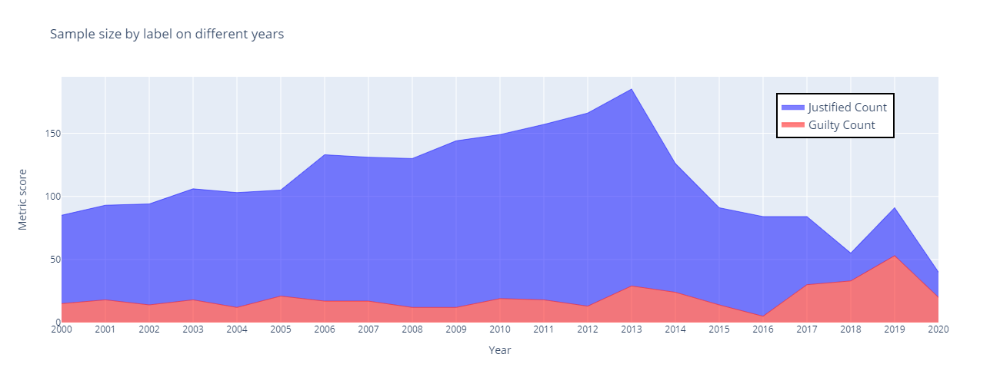


Overall, the trend considering also the classification of pending cases results to be similar to the ones got by classifying guilty and justified cases: number of guilty cases increase.   



# Conclusions

Overall we are quite happy with our model: the **performances are quite good**, considering the fact that the dataset was not created with any data science task in mind. Even the explainations provided by SHAP made sense most of the time. 

As an idea for **future analysis**, we think applying some **Text Analytics** techniques on the cases description could improve the model by a lot, delving deeper into the actual dynamics of the events.